In [ ]:
'''Introduction
Here we want to forecast the spatio-temporal water quality in terms of the “power of hydrogen (pH)” value for the next day based on the input data, which is the historical data of other water measurement indices. The input data consists of daily samples for 36 sites, providing measurements related to pH values in Georgia, USA. The input features consist of 11 common indices including volume of dissolved oxygen, temperature, and specific conductance (see details in dataset). The output to predict is the measurement of 'pH, water, unfiltered, field, standard units (Median)'.
There are two major water systems to consider: one is centered on the city of Atlanta while the other is centered on the eastern coast of Georgia. This information indicates spatial depenency among different locations which are important to the forecast.



Data format: *.mat (use Matlab to open)

Data description:
Variable Name	Type	Size	Description
features	array of strings	1*11	a list of water indices to measure
location_ids	array of integer	37*1	IDs of the water stations
X_te	array of matrices	1*282	test set input data: water indices for 282 contiguous dates until 2018-01-01
•	each element is a 37*11 matrix: 37 spatial locations by 11 features
X_tr	array of matrices	1*423	training set input data: water indices for 423 contiguous dates from 2016-01-28
•	each element is a 37*11 matrix: 37 spatial locations by 11 features
Y_te	array of matrices	37*282	test set output data: water quality for 37 locations in 282 contiguous dates until 2018-01-01
Y_tr	array of matrices	37*423	training set output data: water quality for 37 locations in 423 contiguous dates from 2016-01-28
location_group	array of cells	1*3	the groups of water stations, each group forms a connected spatial network (i.e., water system)

CITATION:
Liang Zhao, Olga Gkountouna, and Dieter Pfoser. 2019. Spatial Auto-regressive Dependency Interpretable Learning Based on Spatial Topological Constraints. ACM Trans. Spatial Algorithms Syst. 5, 3, Article 19 (August 2019), 28 pages. DOI:https://doi.org/10.1145/3339823


In [1]:
import scipy.io
import pandas as pd
import numpy as np


mat = scipy.io.loadmat('E:\\Machine learning\\water_dataset.mat')

In [2]:
mat.keys()

dict_keys(['__header__', '__version__', '__globals__', 'X_tr', 'X_te', 'Y_tr', 'Y_te', 'location_group', 'features', 'location_ids'])

In [3]:
mat["features"].shape

(1, 11)

In [4]:
mat["features"][0][1]

array(['pH, water, unfiltered, field, standard units (Maximum)'],
      dtype='<U54')

In [5]:
# FRAMING THE DATA FOR APPLYING IT TO OUR MODEL

In [6]:
mat["features"].shape
# a list of water indices to measure( 1*11)
# array of strings

(1, 11)

In [7]:
array_id=np.array(mat["location_ids"])
# location ids of the locations where sample of water is investgated (37 *1)
# array of integers

In [8]:
print(mat["X_te"][0].shape)
print(mat["X_te"].shape)
mat["X_te"]
#array of matrices
#(1*282) 282 contigous dates for which measurements are taken, each element of this array is matrix 

(282,)
(1, 282)


array([[array([[0.00230019, 0.91025641, 0.00198428, 0.00205078, 0.57894737,
        0.86585366, 0.65151515, 0.66141732, 0.571875  , 0.57371795,
        0.54360465],
       [0.24366472, 0.92307692, 0.00253438, 0.11054688, 0.57236842,
        0.90243902, 0.57575758, 0.50393701, 0.553125  , 0.54166667,
        0.5377907 ],
       [0.208577  , 0.88461538, 0.00795678, 0.09550781, 0.56578947,
        0.8902439 , 0.58333333, 0.53543307, 0.55625   , 0.54487179,
        0.55232558],
       [0.39181287, 0.93589744, 0.0611002 , 0.22851562, 0.51973684,
        0.92682927, 0.53030303, 0.51968504, 0.5375    , 0.52884615,
        0.52616279],
       [0.49707602, 0.96153846, 0.24361493, 0.35351562, 0.48684211,
        0.92682927, 0.53030303, 0.51968504, 0.53125   , 0.52884615,
        0.51453488],
       [0.14658869, 0.91025641, 0.00844794, 0.03945312, 0.51315789,
        0.87804878, 0.54545455, 0.51968504, 0.56875   , 0.54807692,
        0.55232558],
       [0.22417154, 0.87179487, 0.02180747, 0.1175

In [9]:
print(mat["X_tr"][0][0].shape)
print(mat["X_tr"].shape)
mat["X_tr"]

(37, 11)
(1, 423)


array([[array([[1.13060429e-03, 8.84615385e-01, 1.11984283e-03, 1.11328125e-03,
        6.77631579e-01, 8.41463415e-01, 7.65151515e-01, 7.87401575e-01,
        2.93750000e-01, 2.98076923e-01, 2.76162791e-01],
       [1.16959064e-03, 8.71794872e-01, 1.15913556e-03, 1.15234375e-03,
        7.03947368e-01, 8.29268293e-01, 7.72727273e-01, 7.95275591e-01,
        2.93750000e-01, 3.01282051e-01, 2.76162791e-01],
       [1.32553606e-03, 8.84615385e-01, 1.19842829e-03, 1.25000000e-03,
        6.77631579e-01, 8.53658537e-01, 7.50000000e-01, 7.55905512e-01,
        3.00000000e-01, 2.98076923e-01, 2.87790698e-01],
       [1.40935673e-02, 8.58974359e-01, 1.23772102e-03, 3.92578125e-03,
        6.97368421e-01, 8.29268293e-01, 7.72727273e-01, 7.71653543e-01,
        2.96875000e-01, 2.94871795e-01, 2.79069767e-01],
       [8.81091618e-02, 8.58974359e-01, 1.07662083e-02, 2.92968750e-02,
        6.84210526e-01, 8.53658537e-01, 7.65151515e-01, 7.55905512e-01,
        2.96875000e-01, 2.91666667e-01, 2.81

In [10]:

times_tr = pd.date_range('2016-1-28', periods=423)
len(times_tr)
times_tr

DatetimeIndex(['2016-01-28', '2016-01-29', '2016-01-30', '2016-01-31',
               '2016-02-01', '2016-02-02', '2016-02-03', '2016-02-04',
               '2016-02-05', '2016-02-06',
               ...
               '2017-03-16', '2017-03-17', '2017-03-18', '2017-03-19',
               '2017-03-20', '2017-03-21', '2017-03-22', '2017-03-23',
               '2017-03-24', '2017-03-25'],
              dtype='datetime64[ns]', length=423, freq='D')

In [11]:
times_te = pd.date_range(end='2018-1-1', periods=282)
len(times_te)
times_te

DatetimeIndex(['2017-03-26', '2017-03-27', '2017-03-28', '2017-03-29',
               '2017-03-30', '2017-03-31', '2017-04-01', '2017-04-02',
               '2017-04-03', '2017-04-04',
               ...
               '2017-12-23', '2017-12-24', '2017-12-25', '2017-12-26',
               '2017-12-27', '2017-12-28', '2017-12-29', '2017-12-30',
               '2017-12-31', '2018-01-01'],
              dtype='datetime64[ns]', length=282, freq='D')

In [12]:
# Getting training and test data
X_tr=mat["X_tr"]
Y_tr=mat["Y_tr"]
X_te=mat["X_te"]
Y_te=mat["Y_te"]

In [13]:
X_te[0][281].shape

(37, 11)

In [14]:
mat["features"][0]

array([array(['Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)'],
      dtype='<U100'),
       array(['pH, water, unfiltered, field, standard units (Maximum)'],
      dtype='<U54'),
       array(['pH, water, unfiltered, field, standard units (Minimum)'],
      dtype='<U54'),
       array(['Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Minimum)'],
      dtype='<U100'),
       array(['Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Mean)'],
      dtype='<U97'),
       array(['Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)'],
      dtype='<U67'),
       array(['Dissolved oxygen, water, unfiltered, milligrams per liter (Mean)'],
      dtype='<U64'),
       array(['Dissolved oxygen, water, unfiltered, milligrams per liter (Minimum)'],
      dtype='<U67'),
       array(['Temperature, water, degrees Celsius (Mean)'], dtype='<U42'),

In [15]:
list1=[]
for e in range(0,11):
    list1.append(mat["features"][0][e][0])
list1
array_features=np.array(list1)
array_features.shape


(11,)

In [16]:
df_oneday=pd.DataFrame(data=X_te[0][0],columns=array_features)
# DF for a singl day at 37 location ids, so we need to add 2 columns here first of date and second of location ids

In [17]:
df_location=pd.DataFrame(data=array_id,columns=["location_id"])


In [18]:
#we need to add a categorical column having location ids divided according to the 3 categories given above
list_no=[ f for f in range(1,38)]
c1=mat["location_group"][0][0][0]
c2=mat["location_group"][0][1][0]
c3=mat["location_group"][0][2][0]
list2=[]
print(c1,c2,c3)
for elements in list_no:
    if elements in  c1:
        a=list_no.index(elements)
        list_no[a]=0
    elif elements in c2:
        b=list_no.index(elements)
        list_no[b]=1
    else:
        c=list_no.index(elements)
        list_no[c]=2
location_cat=np.array(list_no)
df_location_cat=pd.DataFrame(data=location_cat,columns=["location_cat"])

[35] [ 1  2  3 31 32 33 34 37] [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
 28 29 30 36]


In [19]:
df_oneday=pd.concat([df_oneday,df_location,df_location_cat],axis=1)

In [20]:
df_oneday["date"]=times_te[0]
df_oneday

,"Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)","pH, water, unfiltered, field, standard units (Maximum)","pH, water, unfiltered, field, standard units (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)","Dissolved oxygen, water, unfiltered, milligrams per liter (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Minimum)","Temperature, water, degrees Celsius (Mean)","Temperature, water, degrees Celsius (Minimum)","Temperature, water, degrees Celsius (Maximum)",location_id,location_cat,date
0,0.002300,0.910256,0.001984,0.002051,0.578947,0.865854,0.651515,0.661417,0.571875,0.573718,0.543605,2198840,1,2017-03-26
1,0.243665,0.923077,0.002534,0.110547,0.572368,0.902439,0.575758,0.503937,0.553125,0.541667,0.537791,2198920,1,2017-03-26
2,0.208577,0.884615,0.007957,0.095508,0.565789,0.890244,0.583333,0.535433,0.556250,0.544872,0.552326,2198950,1,2017-03-26
3,0.391813,0.935897,0.061100,0.228516,0.519737,0.926829,0.530303,0.519685,0.537500,0.528846,0.526163,2203603,2,2017-03-26
4,0.497076,0.961538,0.243615,0.353516,0.486842,0.926829,0.530303,0.519685,0.531250,0.528846,0.514535,2203655,2,2017-03-26
5,0.146589,0.910256,0.008448,0.039453,0.513158,0.878049,0.545455,0.519685,0.568750,0.548077,0.552326,2203700,2,2017-03-26
6,0.224172,0.871795,0.021807,0.117578,0.526316,0.865854,0.575758,0.559055,0.562500,0.554487,0.549419,2203831,2,2017-03-26
7,0.465887,0.923077,0.123576,0.314453,0.532895,0.926829,0.568182,0.566929,0.543750,0.532051,0.540698,2203863,2,2017-03-26
8,0.740741,0.923077,0.693517,0.716797,0.473684,0.902439,0.454545,0.354331,0.603125,0.580128,0.639535,2203873,2,2017-03-26
9,0.005029,0.782051,0.001925,0.002715,0.578947,0.804878,0.613636,0.582677,0.550000,0.512821,0.563953,2203900,2,2017-03-26


In [21]:
#We need to do add date column since all the data is of single day of 37 different locations

In [22]:
for k in range(1,282):
    df_onedayx=pd.DataFrame(data=X_te[0][k],columns=array_features)
    df_location=pd.DataFrame(data=array_id,columns=["location_id"])
    df_onedayx=pd.concat([df_onedayx,df_location,df_location_cat],axis=1)
    df_onedayx["date"]=times_te[k]
    #print(df_onedayx["date"])
    print(df_onedayx)
    df_oneday=pd.concat([df_oneday,df_onedayx],axis=0)


    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.002456                                                      
1                                            0.237817                                                      
2                                            0.181481                                                      
3                                            0.331384                                                      
4                                            0.516569                                                      
5                                            0.131969                                                      
6                                            0.226121                                                      
7                                            0.454191                                                      
8                           

36 2017-04-06  
    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.001930                                                      
1                                            0.208577                                                      
2                                            0.107602                                                      
3                                            0.294347                                                      
4                                            0.313840                                                      
5                                            0.076803                                                      
6                                            0.138012                                                      
7                                            0.319688                                                      
8           

    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.004035                                                      
1                                            0.325536                                                      
2                                            0.253411                                                      
3                                            0.415205                                                      
4                                            0.557505                                                      
5                                            0.165692                                                      
6                                            0.313840                                                      
7                                            0.497076                                                      
8                           

36 2017-05-11  
    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.002086                                                      
1                                            0.374269                                                      
2                                            0.257310                                                      
3                                            0.411306                                                      
4                                            0.458090                                                      
5                                            0.194737                                                      
6                                            0.255361                                                      
7                                            0.461988                                                      
8           

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.002710                                                      
1                                            0.493177                                                      
2                                            0.421053                                                      
3                                            0.522417                                                      
4                                            0.563353                                                      
5                                            0.304094                                                      
6                                            0.263158                                                      
7                                            0.518519                                                      
8                           

    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.004288                                                      
1                                            0.309942                                                      
2                                            0.226121                                                      
3                                            0.382066                                                      
4                                            0.512671                                                      
5                                            0.143860                                                      
6                                            0.304094                                                      
7                                            0.467836                                                      
8                           

    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.002593                                                      
1                                            0.395712                                                      
2                                            0.274854                                                      
3                                            0.442495                                                      
4                                            0.510721                                                      
5                                            0.183626                                                      
6                                            0.274854                                                      
7                                            0.458090                                                      
8                           

    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.002320                                                      
1                                            0.504873                                                      
2                                            0.424951                                                      
3                                            0.524366                                                      
4                                            0.561404                                                      
5                                            0.313840                                                      
6                                            0.230019                                                      
7                                            0.487329                                                      
8                           

    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.011306                                                      
1                                            0.346979                                                      
2                                            0.307992                                                      
3                                            0.460039                                                      
4                                            0.602339                                                      
5                                            0.216374                                                      
6                                            0.385965                                                      
7                                            0.502924                                                      
8                           

    Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)  \
0                                            0.002222                                                      
1                                            0.286550                                                      
2                                            0.243665                                                      
3                                            0.354776                                                      
4                                            0.442495                                                      
5                                            0.180897                                                      
6                                            0.208577                                                      
7                                            0.356725                                                      
8                           

In [23]:
df_oneday
X_test=df_oneday

#dataframe x_test is formed same logic will be applied to form other dataframes

In [24]:
X_test.reset_index(inplace=True)
X_test.head(60)

,index,"Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)","pH, water, unfiltered, field, standard units (Maximum)","pH, water, unfiltered, field, standard units (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)","Dissolved oxygen, water, unfiltered, milligrams per liter (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Minimum)","Temperature, water, degrees Celsius (Mean)","Temperature, water, degrees Celsius (Minimum)","Temperature, water, degrees Celsius (Maximum)",location_id,location_cat,date
0,0,0.002300,0.910256,0.001984,0.002051,0.578947,0.865854,0.651515,0.661417,0.571875,0.573718,0.543605,2198840,1,2017-03-26
1,1,0.243665,0.923077,0.002534,0.110547,0.572368,0.902439,0.575758,0.503937,0.553125,0.541667,0.537791,2198920,1,2017-03-26
2,2,0.208577,0.884615,0.007957,0.095508,0.565789,0.890244,0.583333,0.535433,0.556250,0.544872,0.552326,2198950,1,2017-03-26
3,3,0.391813,0.935897,0.061100,0.228516,0.519737,0.926829,0.530303,0.519685,0.537500,0.528846,0.526163,2203603,2,2017-03-26
4,4,0.497076,0.961538,0.243615,0.353516,0.486842,0.926829,0.530303,0.519685,0.531250,0.528846,0.514535,2203655,2,2017-03-26
5,5,0.146589,0.910256,0.008448,0.039453,0.513158,0.878049,0.545455,0.519685,0.568750,0.548077,0.552326,2203700,2,2017-03-26
6,6,0.224172,0.871795,0.021807,0.117578,0.526316,0.865854,0.575758,0.559055,0.562500,0.554487,0.549419,2203831,2,2017-03-26
7,7,0.465887,0.923077,0.123576,0.314453,0.532895,0.926829,0.568182,0.566929,0.543750,0.532051,0.540698,2203863,2,2017-03-26
8,8,0.740741,0.923077,0.693517,0.716797,0.473684,0.902439,0.454545,0.354331,0.603125,0.580128,0.639535,2203873,2,2017-03-26
9,9,0.005029,0.782051,0.001925,0.002715,0.578947,0.804878,0.613636,0.582677,0.550000,0.512821,0.563953,2203900,2,2017-03-26


In [25]:
# x_train dataframe 
df_oneday1=pd.DataFrame(data=X_tr[0][0],columns=array_features)
df_location=pd.DataFrame(data=array_id,columns=["location_id"])
df_oneday1=pd.concat([df_oneday1,df_location,df_location_cat],axis=1)
df_oneday1["date"]=times_tr[0]

for m in range(1,423):
    df_onedayy=pd.DataFrame(data=X_tr[0][m],columns=array_features)
    df_location=pd.DataFrame(data=array_id,columns=["location_id"])
    df_onedayy=pd.concat([df_onedayy,df_location,df_location_cat],axis=1)
    df_onedayy["date"]=times_tr[m]
    
    df_oneday1=pd.concat([df_oneday1,df_onedayy],axis=0)

X_train=df_oneday1


X_train.reset_index(inplace=True)

In [26]:
X_train.head(60)


,index,"Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)","pH, water, unfiltered, field, standard units (Maximum)","pH, water, unfiltered, field, standard units (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)","Dissolved oxygen, water, unfiltered, milligrams per liter (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Minimum)","Temperature, water, degrees Celsius (Mean)","Temperature, water, degrees Celsius (Minimum)","Temperature, water, degrees Celsius (Maximum)",location_id,location_cat,date
0,0,0.001131,0.884615,0.001120,0.001113,0.677632,0.841463,0.765152,0.787402,0.293750,0.298077,0.276163,2198840,1,2016-01-28
1,1,0.001170,0.871795,0.001159,0.001152,0.703947,0.829268,0.772727,0.795276,0.293750,0.301282,0.276163,2198920,1,2016-01-28
2,2,0.001326,0.884615,0.001198,0.001250,0.677632,0.853659,0.750000,0.755906,0.300000,0.298077,0.287791,2198950,1,2016-01-28
3,3,0.014094,0.858974,0.001238,0.003926,0.697368,0.829268,0.772727,0.771654,0.296875,0.294872,0.279070,2203603,2,2016-01-28
4,4,0.088109,0.858974,0.010766,0.029297,0.684211,0.853659,0.765152,0.755906,0.296875,0.291667,0.281977,2203655,2,2016-01-28
5,5,0.001326,0.833333,0.001257,0.001270,0.684211,0.804878,0.757576,0.771654,0.303125,0.298077,0.299419,2203700,2,2016-01-28
6,6,0.002963,0.833333,0.001297,0.001504,0.684211,0.804878,0.757576,0.763780,0.309375,0.307692,0.296512,2203831,2,2016-01-28
7,7,0.070760,0.858974,0.001552,0.022656,0.684211,0.829268,0.765152,0.771654,0.306250,0.294872,0.293605,2203863,2,2016-01-28
8,8,0.518519,0.948718,0.455796,0.476562,0.585526,0.926829,0.636364,0.622047,0.378125,0.368590,0.369186,2203873,2,2016-01-28
9,9,0.004230,0.884615,0.003831,0.004141,0.697368,0.841463,0.787879,0.811024,0.315625,0.304487,0.316860,2203900,2,2016-01-28


In [27]:
# Creating Y_test and Y_train for prediction of diffrent water factors

In [28]:
# y_train dataframe 
df_oneday1=pd.DataFrame(data=X_tr[0][0],columns=array_features)
df_location=pd.DataFrame(data=array_id,columns=["location_id"])
df_oneday1=pd.concat([df_oneday1,df_location,df_location_cat],axis=1)
df_oneday1["date"]=times_tr[0]

for m in range(1,423):
    df_onedayy=pd.DataFrame(data=X_tr[0][m],columns=array_features)
    df_location=pd.DataFrame(data=array_id,columns=["location_id"])
    df_onedayy=pd.concat([df_onedayy,df_location,df_location_cat],axis=1)
    df_onedayy["date"]=times_tr[m]
    
    df_oneday1=pd.concat([df_oneday1,df_onedayy],axis=0)

X_train=df_oneday1


X_train.reset_index(inplace=True)

In [29]:
X_train["pH, water, unfiltered, field, standard units (Median)"]=X_train["pH, water, unfiltered, field, standard units (Maximum)"]+X_train["pH, water, unfiltered, field, standard units (Minimum)"]/2

In [30]:
X_test["pH, water, unfiltered, field, standard units (Median)"]=X_test["pH, water, unfiltered, field, standard units (Maximum)"]+X_test["pH, water, unfiltered, field, standard units (Minimum)"]/2


In [31]:
x_train=X_train.drop("pH, water, unfiltered, field, standard units (Median)",axis=1)

In [32]:
x_test=X_test.drop("pH, water, unfiltered, field, standard units (Median)",axis=1)

In [33]:
y_train=pd.DataFrame(data=X_train["pH, water, unfiltered, field, standard units (Median)"],columns=["pH, water, unfiltered, field, standard units (Median)"])
y_test=pd.DataFrame(data=X_test["pH, water, unfiltered, field, standard units (Median)"],columns=["pH, water, unfiltered, field, standard units (Median)"])
y_test=pd.concat([y_test,X_test["date"],X_test["location_id"]],axis=1)
y_train=pd.concat([y_train,X_train["date"],X_train["location_id"]],axis=1)

In [34]:
mat["Y_te"]

array([[0.66666667, 0.66666667, 0.65740741, ..., 0.67592593, 0.67592593,
        0.67592593],
       [0.71296296, 0.71296296, 0.71296296, ..., 0.72222222, 0.72222222,
        0.72222222],
       [0.7037037 , 0.7037037 , 0.7037037 , ..., 0.72222222, 0.71296296,
        0.72222222],
       ...,
       [0.67592593, 0.67592593, 0.67592593, ..., 0.68518519, 0.68518519,
        0.69444444],
       [0.66666667, 0.66666667, 0.68518519, ..., 0.65740741, 0.65740741,
        0.65740741],
       [0.68518519, 0.67592593, 0.68518519, ..., 0.65740741, 0.64814815,
        0.65740741]])

In [35]:
y_tes1=pd.DataFrame(data=mat["Y_te"],columns=times_te,index=array_id.reshape(37,))
#reshape of array_id since 1 dimensional data was required
y_tes1

,2017-03-26,2017-03-27,2017-03-28,2017-03-29,2017-03-30,2017-03-31,2017-04-01,2017-04-02,2017-04-03,2017-04-04,...,2017-12-23,2017-12-24,2017-12-25,2017-12-26,2017-12-27,2017-12-28,2017-12-29,2017-12-30,2017-12-31,2018-01-01
2198840,0.666667,0.666667,0.657407,0.657407,0.657407,0.657407,0.657407,0.657407,0.657407,0.657407,...,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.675926,0.675926,0.675926
2198920,0.712963,0.712963,0.712963,0.712963,0.712963,0.703704,0.703704,0.703704,0.694444,0.694444,...,0.712963,0.712963,0.722222,0.740741,0.731481,0.722222,0.722222,0.722222,0.722222,0.722222
2198950,0.703704,0.703704,0.703704,0.703704,0.703704,0.703704,0.685185,0.694444,0.685185,0.685185,...,0.703704,0.703704,0.722222,0.722222,0.722222,0.722222,0.712963,0.722222,0.712963,0.722222
2203603,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.703704,0.703704,0.703704,0.703704,...,0.703704,0.712963,0.722222,0.722222,0.722222,0.722222,0.722222,0.712963,0.712963,0.712963
2203655,0.712963,0.712963,0.712963,0.712963,0.712963,0.703704,0.703704,0.703704,0.703704,0.703704,...,0.685185,0.685185,0.685185,0.685185,0.703704,0.703704,0.694444,0.694444,0.694444,0.694444
2203700,0.694444,0.694444,0.685185,0.675926,0.675926,0.666667,0.675926,0.675926,0.675926,0.675926,...,0.666667,0.666667,0.666667,0.675926,0.675926,0.685185,0.675926,0.666667,0.666667,0.675926
2203831,0.666667,0.666667,0.675926,0.685185,0.675926,0.685185,0.666667,0.666667,0.666667,0.657407,...,0.675926,0.675926,0.675926,0.685185,0.685185,0.694444,0.694444,0.694444,0.694444,0.712963
2203863,0.722222,0.722222,0.722222,0.722222,0.722222,0.712963,0.712963,0.712963,0.712963,0.712963,...,0.712963,0.703704,0.703704,0.712963,0.712963,0.712963,0.712963,0.722222,0.712963,0.722222
2203873,0.712963,0.712963,0.703704,0.712963,0.703704,0.703704,0.703704,0.703704,0.703704,0.703704,...,0.731481,0.731481,0.731481,0.740741,0.740741,0.740741,0.740741,0.740741,0.740741,0.740741
2203900,0.620370,0.611111,0.601852,0.601852,0.611111,0.601852,0.611111,0.601852,0.638889,0.657407,...,0.685185,0.675926,0.648148,0.629630,0.620370,0.648148,0.629630,0.620370,0.611111,0.611111


In [36]:
y_tes2=y_test.pivot_table(values="pH, water, unfiltered, field, standard units (Median)",index=["location_id"],columns=["date"])
y_tes2

date,2017-03-26,2017-03-27,2017-03-28,2017-03-29,2017-03-30,2017-03-31,2017-04-01,2017-04-02,2017-04-03,2017-04-04,...,2017-12-23,2017-12-24,2017-12-25,2017-12-26,2017-12-27,2017-12-28,2017-12-29,2017-12-30,2017-12-31,2018-01-01
location_id,,,,,,,,,,,,,,,,,,,,,
2198840,0.911249,0.911268,0.911249,0.898428,0.898428,0.885647,0.898507,0.898487,0.898477,0.898448,...,0.924157,0.924128,0.924089,0.924099,0.911288,0.911288,0.924138,0.924138,0.924157,0.924187
2198920,0.924344,0.924344,0.924354,0.911504,0.911681,0.911563,0.911553,0.924334,0.924344,0.911425,...,0.924344,0.911504,0.924266,0.924963,0.924482,0.911700,0.911563,0.924364,0.924354,0.924541
2198950,0.888594,0.888810,0.888633,0.887474,0.889331,0.888476,0.887435,0.900658,0.900736,0.887277,...,0.913989,0.913606,0.913498,0.927399,0.927311,0.926977,0.926977,0.927321,0.929963,0.932507
2203603,0.966448,0.967037,0.958884,0.957214,0.949403,0.938303,0.947242,0.967528,0.950385,0.949207,...,0.973717,0.970180,0.949746,1.037520,1.027991,1.026518,0.991988,0.970082,0.971752,0.955690
2203655,1.083346,1.060753,1.040910,1.043464,1.050340,1.036391,1.023865,1.043806,1.055791,1.038404,...,1.023273,1.023273,1.008488,1.073422,1.093068,1.085159,1.084177,1.066495,1.041937,1.057705
2203700,0.914480,0.902141,0.889193,0.888771,0.889114,0.876392,0.875695,0.888044,0.888093,0.887926,...,0.882306,0.881510,0.879575,0.878976,0.866204,0.880174,0.881618,0.897091,0.898663,0.902199
2203831,0.882699,0.881559,0.880213,0.879565,0.895421,0.880017,0.878779,0.880724,0.893378,0.878455,...,0.910894,0.909715,0.910108,0.934029,0.924304,0.940464,0.923714,0.910402,0.914528,0.929706
2203863,0.984865,0.979953,0.959274,0.955050,0.964087,0.950531,0.945620,0.965710,0.967478,0.954166,...,0.966495,0.963450,0.971850,1.012667,0.991005,1.016400,1.008541,0.995033,0.983933,0.990809
2203873,1.269835,1.269835,1.255050,1.260012,1.248174,1.263941,1.263941,1.252154,1.250189,1.246260,...,1.372198,1.354466,1.367286,1.382071,1.378142,1.396857,1.381089,1.382071,1.386001,1.386983


In [37]:
y_tes1==y_tes2

,2017-03-26,2017-03-27,2017-03-28,2017-03-29,2017-03-30,2017-03-31,2017-04-01,2017-04-02,2017-04-03,2017-04-04,...,2017-12-23,2017-12-24,2017-12-25,2017-12-26,2017-12-27,2017-12-28,2017-12-29,2017-12-30,2017-12-31,2018-01-01
2198840,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2198920,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2198950,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2203603,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2203655,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2203700,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2203831,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2203863,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2203873,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2203900,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [38]:
" since the y_test and y_train data already given in dataset have diffrent median ph values than we calculated via formula of median in our x_test and x_train , also obvious cause if there was a direct relation between median and maximum/minimum ph values in prediction set and features then there will be no requirement of other features for prediction of median pH values.
"we will consider the data given in dataset and drop the previous calculation done by us. 

SyntaxError: EOL while scanning string literal (<ipython-input-38-0db8f03b7da2>, line 1)

In [39]:



y_test=pd.DataFrame(data=mat["Y_te"],columns=times_te,index=array_id.reshape(37,))
y_train=pd.DataFrame(data=mat["Y_tr"],columns=times_tr,index=array_id.reshape(37,))

In [40]:
y_train

,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,2016-02-06,...,2017-03-16,2017-03-17,2017-03-18,2017-03-19,2017-03-20,2017-03-21,2017-03-22,2017-03-23,2017-03-24,2017-03-25
2198840,0.648148,0.648148,0.648148,0.648148,0.648148,0.638889,0.638889,0.638889,0.638889,0.629630,...,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667
2198920,0.648148,0.648148,0.638889,0.648148,0.638889,0.638889,0.638889,0.638889,0.629630,0.638889,...,0.722222,0.722222,0.722222,0.722222,0.722222,0.712963,0.722222,0.722222,0.712963,0.712963
2198950,0.648148,0.648148,0.648148,0.648148,0.648148,0.648148,0.648148,0.648148,0.638889,0.638889,...,0.712963,0.712963,0.703704,0.703704,0.703704,0.694444,0.712963,0.722222,0.703704,0.703704
2203603,0.638889,0.638889,0.657407,0.657407,0.675926,0.666667,0.666667,0.666667,0.648148,0.657407,...,0.722222,0.722222,0.722222,0.722222,0.731481,0.722222,0.731481,0.731481,0.712963,0.712963
2203655,0.648148,0.657407,0.666667,0.657407,0.666667,0.666667,0.666667,0.657407,0.666667,0.657407,...,0.722222,0.722222,0.722222,0.722222,0.722222,0.712963,0.722222,0.722222,0.712963,0.712963
2203700,0.620370,0.620370,0.620370,0.620370,0.620370,0.620370,0.620370,0.611111,0.611111,0.611111,...,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.703704
2203831,0.620370,0.620370,0.620370,0.620370,0.620370,0.611111,0.620370,0.620370,0.611111,0.629630,...,0.694444,0.694444,0.685185,0.685185,0.685185,0.685185,0.703704,0.703704,0.675926,0.666667
2203863,0.657407,0.666667,0.666667,0.657407,0.666667,0.666667,0.666667,0.657407,0.666667,0.657407,...,0.731481,0.731481,0.731481,0.731481,0.731481,0.731481,0.731481,0.731481,0.722222,0.722222
2203873,0.722222,0.722222,0.731481,0.731481,0.740741,0.740741,0.740741,0.731481,0.740741,0.750000,...,0.722222,0.731481,0.731481,0.740741,0.740741,0.740741,0.740741,0.740741,0.722222,0.722222
2203900,0.648148,0.638889,0.638889,0.648148,0.648148,0.638889,0.666667,0.657407,0.648148,0.648148,...,0.620370,0.620370,0.638889,0.638889,0.620370,0.611111,0.629630,0.611111,0.601852,0.638889


In [41]:
y_train

,2016-01-28,2016-01-29,2016-01-30,2016-01-31,2016-02-01,2016-02-02,2016-02-03,2016-02-04,2016-02-05,2016-02-06,...,2017-03-16,2017-03-17,2017-03-18,2017-03-19,2017-03-20,2017-03-21,2017-03-22,2017-03-23,2017-03-24,2017-03-25
2198840,0.648148,0.648148,0.648148,0.648148,0.648148,0.638889,0.638889,0.638889,0.638889,0.629630,...,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667,0.666667
2198920,0.648148,0.648148,0.638889,0.648148,0.638889,0.638889,0.638889,0.638889,0.629630,0.638889,...,0.722222,0.722222,0.722222,0.722222,0.722222,0.712963,0.722222,0.722222,0.712963,0.712963
2198950,0.648148,0.648148,0.648148,0.648148,0.648148,0.648148,0.648148,0.648148,0.638889,0.638889,...,0.712963,0.712963,0.703704,0.703704,0.703704,0.694444,0.712963,0.722222,0.703704,0.703704
2203603,0.638889,0.638889,0.657407,0.657407,0.675926,0.666667,0.666667,0.666667,0.648148,0.657407,...,0.722222,0.722222,0.722222,0.722222,0.731481,0.722222,0.731481,0.731481,0.712963,0.712963
2203655,0.648148,0.657407,0.666667,0.657407,0.666667,0.666667,0.666667,0.657407,0.666667,0.657407,...,0.722222,0.722222,0.722222,0.722222,0.722222,0.712963,0.722222,0.722222,0.712963,0.712963
2203700,0.620370,0.620370,0.620370,0.620370,0.620370,0.620370,0.620370,0.611111,0.611111,0.611111,...,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.712963,0.703704
2203831,0.620370,0.620370,0.620370,0.620370,0.620370,0.611111,0.620370,0.620370,0.611111,0.629630,...,0.694444,0.694444,0.685185,0.685185,0.685185,0.685185,0.703704,0.703704,0.675926,0.666667
2203863,0.657407,0.666667,0.666667,0.657407,0.666667,0.666667,0.666667,0.657407,0.666667,0.657407,...,0.731481,0.731481,0.731481,0.731481,0.731481,0.731481,0.731481,0.731481,0.722222,0.722222
2203873,0.722222,0.722222,0.731481,0.731481,0.740741,0.740741,0.740741,0.731481,0.740741,0.750000,...,0.722222,0.731481,0.731481,0.740741,0.740741,0.740741,0.740741,0.740741,0.722222,0.722222
2203900,0.648148,0.638889,0.638889,0.648148,0.648148,0.638889,0.666667,0.657407,0.648148,0.648148,...,0.620370,0.620370,0.638889,0.638889,0.620370,0.611111,0.629630,0.611111,0.601852,0.638889


In [42]:
x_test

,index,"Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)","pH, water, unfiltered, field, standard units (Maximum)","pH, water, unfiltered, field, standard units (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)","Dissolved oxygen, water, unfiltered, milligrams per liter (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Minimum)","Temperature, water, degrees Celsius (Mean)","Temperature, water, degrees Celsius (Minimum)","Temperature, water, degrees Celsius (Maximum)",location_id,location_cat,date
0,0,0.002300,0.910256,0.001984,0.002051,0.578947,0.865854,0.651515,0.661417,0.571875,0.573718,0.543605,2198840,1,2017-03-26
1,1,0.243665,0.923077,0.002534,0.110547,0.572368,0.902439,0.575758,0.503937,0.553125,0.541667,0.537791,2198920,1,2017-03-26
2,2,0.208577,0.884615,0.007957,0.095508,0.565789,0.890244,0.583333,0.535433,0.556250,0.544872,0.552326,2198950,1,2017-03-26
3,3,0.391813,0.935897,0.061100,0.228516,0.519737,0.926829,0.530303,0.519685,0.537500,0.528846,0.526163,2203603,2,2017-03-26
4,4,0.497076,0.961538,0.243615,0.353516,0.486842,0.926829,0.530303,0.519685,0.531250,0.528846,0.514535,2203655,2,2017-03-26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10429,32,0.006238,0.935897,0.006130,0.006172,0.914474,0.902439,0.977273,0.929134,0.068750,0.022436,0.119186,21989792,1,2018-01-01
10430,33,0.003138,0.858974,0.002967,0.003047,0.769737,0.829268,0.856061,0.834646,0.093750,0.044872,0.127907,21989793,1,2018-01-01
10431,34,0.003840,0.948718,0.003399,0.003672,0.750000,0.902439,0.840909,0.850394,0.215625,0.195513,0.238372,22035975,0,2018-01-01
10432,35,0.001287,0.910256,0.001277,0.001289,0.750000,0.865854,0.856061,0.874016,0.225000,0.208333,0.232558,23362095,2,2018-01-01


In [43]:
# changing the rows and column description of y datas set to match x set for predictions
# y_train
df_1=pd.DataFrame(data=np.array(y_train[str(times_tr[0])]),columns=["pH, water, unfiltered, field, standard units (Median)"],index=array_id.reshape(37,))
df_1["date"]=times_tr[0]
for x in range(1,423):
    df_2=pd.DataFrame(data=np.array(y_train[str(times_tr[x])]),columns=["pH, water, unfiltered, field, standard units (Median)"],index=array_id.reshape(37,))
    df_2["date"]=times_tr[x]
    df_1=pd.concat([df_1,df_2],axis=0)


In [44]:
37*423

15651

In [45]:

df_1.reset_index(inplace=True)



In [46]:
df_1.head(60)

,index,"pH, water, unfiltered, field, standard units (Median)",date
0,2198840,0.648148,2016-01-28
1,2198920,0.648148,2016-01-28
2,2198950,0.648148,2016-01-28
3,2203603,0.638889,2016-01-28
4,2203655,0.648148,2016-01-28
5,2203700,0.620370,2016-01-28
6,2203831,0.620370,2016-01-28
7,2203863,0.657407,2016-01-28
8,2203873,0.722222,2016-01-28
9,2203900,0.648148,2016-01-28


In [47]:
# y_test
df_3=pd.DataFrame(data=np.array(y_test[str(times_te[0])]),columns=["pH, water, unfiltered, field, standard units (Median)"],index=array_id.reshape(37,))
df_3["date"]=times_te[0]
for x in range(1,282):
    df_4=pd.DataFrame(data=np.array(y_test[str(times_te[x])]),columns=["pH, water, unfiltered, field, standard units (Median)"],index=array_id.reshape(37,))
    df_4["date"]=times_te[x]
    df_3=pd.concat([df_3,df_4],axis=0)

In [48]:
df_3.reset_index(inplace=True)
df_3.drop(["index","date"],inplace=True,axis=1)

In [49]:
df_3.shape

(10434, 1)

In [50]:
#assigning new dataframes 
y_test=df_3["pH, water, unfiltered, field, standard units (Median)"]
y_train=df_1["pH, water, unfiltered, field, standard units (Median)"]

In [51]:
#Feature engineering on date column

In [52]:
type(x_test["date"][0])

pandas._libs.tslibs.timestamps.Timestamp

In [53]:
x_test["month"] = x_test["date"].dt.month

x_test= pd.concat([x_test,x_test["date"].dt.isocalendar()],axis=1)

In [54]:

x_train["month"] = x_train["date"].dt.month

x_train= pd.concat([x_train,x_train["date"].dt.isocalendar()],axis=1)

In [55]:
x_test["week of the year"]=x_test["week"]
x_test["day of the week"]=x_test["day"]
x_train["week of the year"]=x_train["week"]
x_train["day of the week"]=x_train["day"]
x_train.drop(["index","week","day"],inplace=True,axis=1)
x_test.drop(["index","week","day"],inplace=True,axis=1)

In [56]:
x_train

,"Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)","pH, water, unfiltered, field, standard units (Maximum)","pH, water, unfiltered, field, standard units (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)","Dissolved oxygen, water, unfiltered, milligrams per liter (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Minimum)","Temperature, water, degrees Celsius (Mean)","Temperature, water, degrees Celsius (Minimum)","Temperature, water, degrees Celsius (Maximum)",location_id,location_cat,date,month,year,week of the year,day of the week
0,0.001131,0.884615,0.001120,0.001113,0.677632,0.841463,0.765152,0.787402,0.293750,0.298077,0.276163,2198840,1,2016-01-28,1,2016,4,4
1,0.001170,0.871795,0.001159,0.001152,0.703947,0.829268,0.772727,0.795276,0.293750,0.301282,0.276163,2198920,1,2016-01-28,1,2016,4,4
2,0.001326,0.884615,0.001198,0.001250,0.677632,0.853659,0.750000,0.755906,0.300000,0.298077,0.287791,2198950,1,2016-01-28,1,2016,4,4
3,0.014094,0.858974,0.001238,0.003926,0.697368,0.829268,0.772727,0.771654,0.296875,0.294872,0.279070,2203603,2,2016-01-28,1,2016,4,4
4,0.088109,0.858974,0.010766,0.029297,0.684211,0.853659,0.765152,0.755906,0.296875,0.291667,0.281977,2203655,2,2016-01-28,1,2016,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15646,0.005049,0.910256,0.004676,0.004883,0.888158,0.939024,0.719697,0.535433,0.553125,0.490385,0.584302,21989792,1,2017-03-25,3,2017,12,6
15647,0.002456,0.884615,0.002417,0.002422,0.644737,0.865854,0.651515,0.622047,0.556250,0.522436,0.584302,21989793,1,2017-03-25,3,2017,12,6
15648,0.003821,0.935897,0.003615,0.003750,0.559211,0.890244,0.636364,0.645669,0.571875,0.554487,0.561047,22035975,0,2017-03-25,3,2017,12,6
15649,0.001287,0.897436,0.001277,0.001289,0.631579,0.853659,0.712121,0.724409,0.468750,0.464744,0.462209,23362095,2,2017-03-25,3,2017,12,6


In [57]:

#EDA
df_eda=pd.concat([x_train,y_train],axis=1)
df_eda.head(60)

,"Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)","pH, water, unfiltered, field, standard units (Maximum)","pH, water, unfiltered, field, standard units (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Minimum)","Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)","Dissolved oxygen, water, unfiltered, milligrams per liter (Mean)","Dissolved oxygen, water, unfiltered, milligrams per liter (Minimum)","Temperature, water, degrees Celsius (Mean)","Temperature, water, degrees Celsius (Minimum)","Temperature, water, degrees Celsius (Maximum)",location_id,location_cat,date,month,year,week of the year,day of the week,"pH, water, unfiltered, field, standard units (Median)"
0,0.001131,0.884615,0.001120,0.001113,0.677632,0.841463,0.765152,0.787402,0.293750,0.298077,0.276163,2198840,1,2016-01-28,1,2016,4,4,0.648148
1,0.001170,0.871795,0.001159,0.001152,0.703947,0.829268,0.772727,0.795276,0.293750,0.301282,0.276163,2198920,1,2016-01-28,1,2016,4,4,0.648148
2,0.001326,0.884615,0.001198,0.001250,0.677632,0.853659,0.750000,0.755906,0.300000,0.298077,0.287791,2198950,1,2016-01-28,1,2016,4,4,0.648148
3,0.014094,0.858974,0.001238,0.003926,0.697368,0.829268,0.772727,0.771654,0.296875,0.294872,0.279070,2203603,2,2016-01-28,1,2016,4,4,0.638889
4,0.088109,0.858974,0.010766,0.029297,0.684211,0.853659,0.765152,0.755906,0.296875,0.291667,0.281977,2203655,2,2016-01-28,1,2016,4,4,0.648148
5,0.001326,0.833333,0.001257,0.001270,0.684211,0.804878,0.757576,0.771654,0.303125,0.298077,0.299419,2203700,2,2016-01-28,1,2016,4,4,0.620370
6,0.002963,0.833333,0.001297,0.001504,0.684211,0.804878,0.757576,0.763780,0.309375,0.307692,0.296512,2203831,2,2016-01-28,1,2016,4,4,0.620370
7,0.070760,0.858974,0.001552,0.022656,0.684211,0.829268,0.765152,0.771654,0.306250,0.294872,0.293605,2203863,2,2016-01-28,1,2016,4,4,0.657407
8,0.518519,0.948718,0.455796,0.476562,0.585526,0.926829,0.636364,0.622047,0.378125,0.368590,0.369186,2203873,2,2016-01-28,1,2016,4,4,0.722222
9,0.004230,0.884615,0.003831,0.004141,0.697368,0.841463,0.787879,0.811024,0.315625,0.304487,0.316860,2203900,2,2016-01-28,1,2016,4,4,0.648148


In [58]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [59]:

#as the test data are future dates so plotting graph for year can not be intuitive for our model predictions since prediction should be independent of year

Text(0.5, 1.0, 'Relation between specific conductance (Maximum ) and pH (median)')

<Figure size 720x432 with 0 Axes>

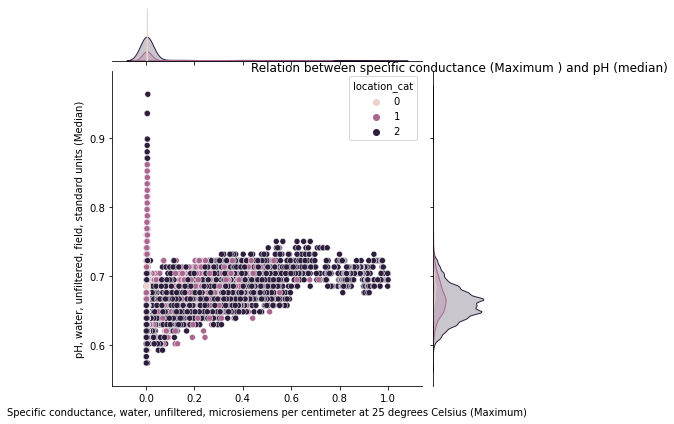

In [60]:

fig=plt.figure(figsize=(10,6))
sns.jointplot(x="Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)",y="pH, water, unfiltered, field, standard units (Median)",data=df_eda,hue="location_cat")
plt.title("Relation between specific conductance (Maximum ) and pH (median)",pad=0.7)
#pattern in distrubution is observed but also along with outliers where specific conductance 0 have varying pH ranges
# most outliers are from location category 1 and 2 

Text(0.5, 1.0, 'Relation between specific conductance (Minimum ) and pH (median)')

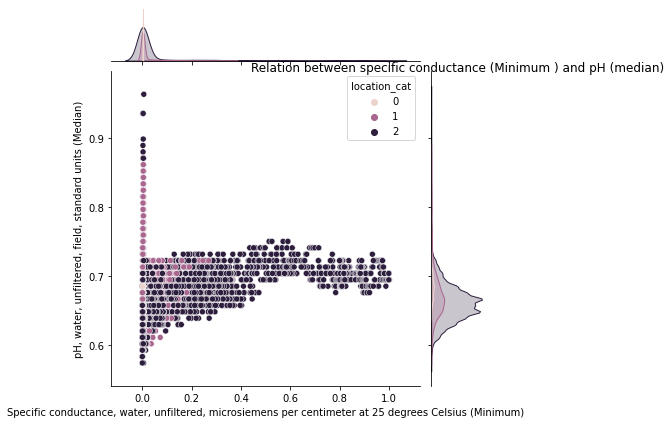

In [61]:
sns.jointplot(x="Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Minimum)",y="pH, water, unfiltered, field, standard units (Median)",data=df_eda,hue="location_cat")
# similiar pattern obseved in minimum specific conductance vs pH
plt.title("Relation between specific conductance (Minimum ) and pH (median)",pad=0.7)


Text(0.5, 1.0, 'Relation between specific conductance (Mean ) and pH (median)')

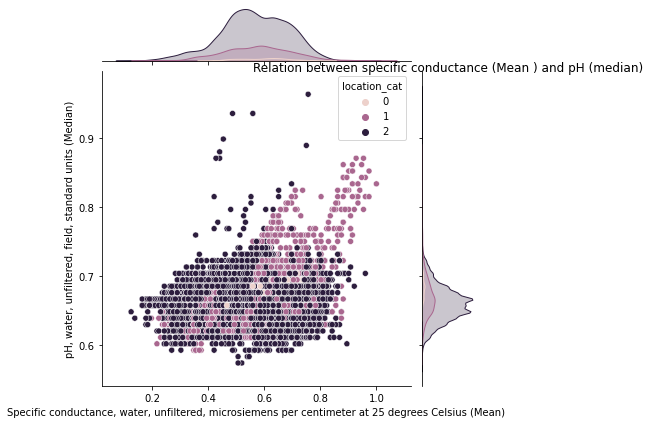

In [62]:
sns.jointplot(x="Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Mean)",y="pH, water, unfiltered, field, standard units (Median)",data=df_eda,hue="location_cat")
plt.title("Relation between specific conductance (Mean ) and pH (median)",pad=0.7)

# by increase in mean specific conductance a pH range of 0.60 to 0.85 with some outliers. Also for specific conductance of particular value the pH is ranging within 0.60 to 0.75 so they arent highly correlated enough to make good predictions.

In [63]:
df_corr=df_eda.drop("date",axis=1).corr()
df_corr[df_corr["pH, water, unfiltered, field, standard units (Median)"]>0.6]["pH, water, unfiltered, field, standard units (Median)"]
#pH values is highly correlated to dissolved oxygen in water. 

pH, water, unfiltered, field, standard units (Maximum)                 0.721502
Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)    0.877174
pH, water, unfiltered, field, standard units (Median)                  1.000000
Name: pH, water, unfiltered, field, standard units (Median), dtype: float64

Text(0.5, 1.0, 'Relation between dissolved oxygen (Maximum ) and pH (median) by location category')

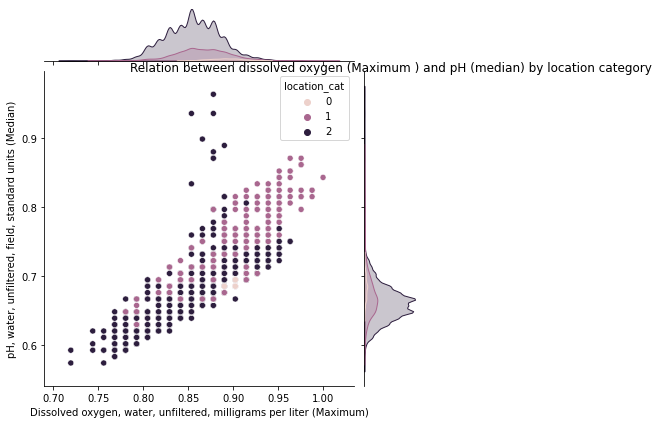

In [64]:
sns.jointplot(x="Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)",y="pH, water, unfiltered, field, standard units (Median)",data=df_eda,hue="location_cat")
plt.title("Relation between dissolved oxygen (Maximum ) and pH (median) by location category",pad=0.7)


#very high correlation and linear relation observed between dissolved oxygen (maximum) and pH values also observed numerically
# also observed that location category 2 has maximum number of outliers and other 2 location categories have quite linear relatoin between dissolved oxygen and pH

Text(0.5, 1.0, 'Relation between Temperature (Maximum ) and pH (median) by location category')

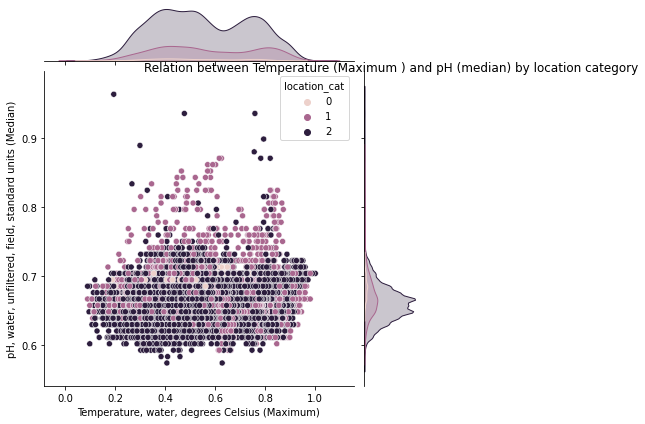

In [65]:
sns.jointplot(x="Temperature, water, degrees Celsius (Maximum)",y="pH, water, unfiltered, field, standard units (Median)",data=df_eda,hue="location_cat")
plt.title("Relation between Temperature (Maximum ) and pH (median) by location category",pad=0.7)

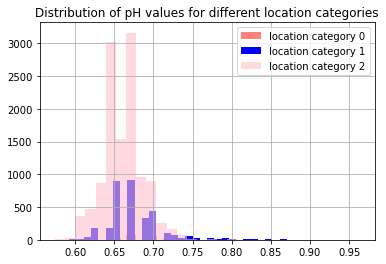

In [66]:
df_eda[df_eda["location_cat"]==0]["pH, water, unfiltered, field, standard units (Median)"].hist(alpha=0.5,color="red",bins=30,label="location category 0")
df_eda[df_eda["location_cat"]==1]["pH, water, unfiltered, field, standard units (Median)"].hist(alpha=1,color="blue",bins=30,label="location category 1")
df_eda[df_eda["location_cat"]==2]["pH, water, unfiltered, field, standard units (Median)"].hist(alpha=0.6,color="pink",bins=30,label="location category 2")
plt.title("Distribution of pH values for different location categories")
plt.legend()
#spatio-temporal water quality in terms of the “power of hydrogen (pH) for location categories centers around 0.65 to 0.70

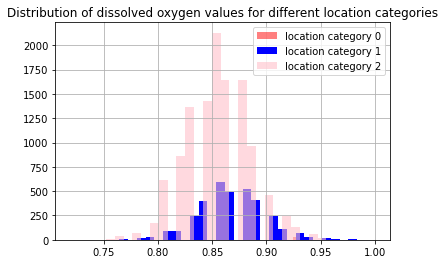

In [67]:
df_eda[df_eda["location_cat"]==0]["Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)"].hist(alpha=0.5,color="red",bins=30,label="location category 0")
df_eda[df_eda["location_cat"]==1]["Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)"].hist(alpha=1,color="blue",bins=30,label="location category 1")
df_eda[df_eda["location_cat"]==2]["Dissolved oxygen, water, unfiltered, milligrams per liter (Maximum)"].hist(alpha=0.6,color="pink",bins=30,label="location category 2")
plt.title("Distribution of dissolved oxygen values for different location categories")
plt.legend()
#dissolved oxygen values for different location categories centers around 0.80 to 0.90

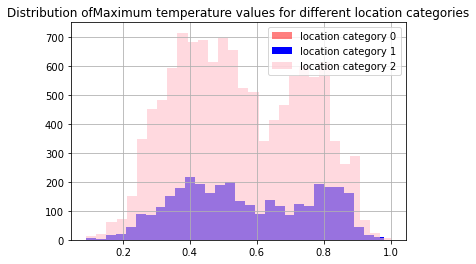

In [68]:
df_eda[df_eda["location_cat"]==0]["Temperature, water, degrees Celsius (Maximum)"].hist(alpha=0.5,color="red",bins=30,label="location category 0")
df_eda[df_eda["location_cat"]==1]["Temperature, water, degrees Celsius (Maximum)"].hist(alpha=1,color="blue",bins=30,label="location category 1")
df_eda[df_eda["location_cat"]==2]["Temperature, water, degrees Celsius (Maximum)"].hist(alpha=0.6,color="pink",bins=30,label="location category 2")
plt.title("Distribution ofMaximum temperature values for different location categories")
plt.legend()


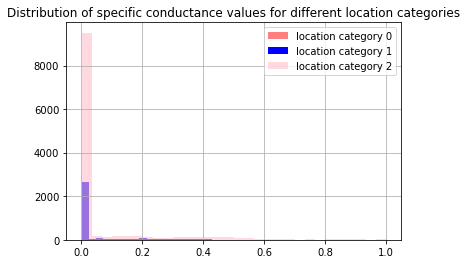

In [69]:
df_eda[df_eda["location_cat"]==0]["Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)"].hist(alpha=0.5,color="red",bins=30,label="location category 0")
df_eda[df_eda["location_cat"]==1]["Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)"].hist(alpha=1,color="blue",bins=30,label="location category 1")
df_eda[df_eda["location_cat"]==2]["Specific conductance, water, unfiltered, microsiemens per centimeter at 25 degrees Celsius (Maximum)"].hist(alpha=0.6,color="pink",bins=30,label="location category 2")
plt.title("Distribution of specific conductance values for different location categories")
plt.legend()


<AxesSubplot:xlabel='month', ylabel='pH, water, unfiltered, field, standard units (Median)'>

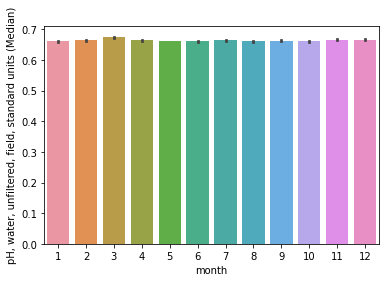

In [70]:
sns.barplot(x="month",y="pH, water, unfiltered, field, standard units (Median)",data=df_eda)
#mean values of pH around the months of the year shows independent constant values wrt to months

<AxesSubplot:xlabel='day of the week', ylabel='pH, water, unfiltered, field, standard units (Median)'>

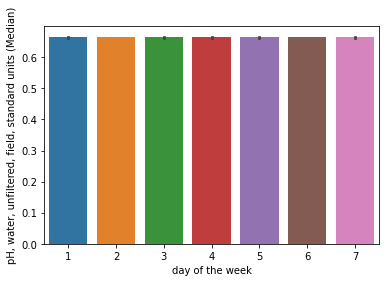

In [71]:
sns.barplot(x="day of the week",y="pH, water, unfiltered, field, standard units (Median)",data=df_eda)
#mean values of pH around the days of the week shows independent constant values wrt to days of week

<AxesSubplot:xlabel='week of the year', ylabel='pH, water, unfiltered, field, standard units (Median)'>

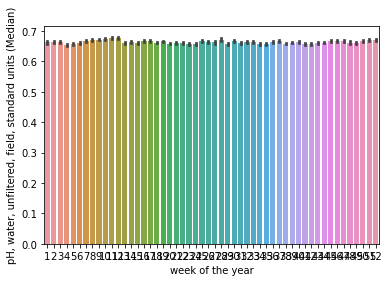

In [72]:
sns.barplot(x="week of the year",y="pH, water, unfiltered, field, standard units (Median)",data=df_eda)
#mean values of pH around the weeks of the year shows independent constant values.

In [73]:
#Training linear model 

In [74]:
y_test

0        0.666667
1        0.712963
2        0.703704
3        0.712963
4        0.712963
           ...   
10429    0.694444
10430    0.629630
10431    0.694444
10432    0.657407
10433    0.657407
Name: pH, water, unfiltered, field, standard units (Median), Length: 10434, dtype: float64

In [75]:
x_train.drop("date",axis=1,inplace=True)
x_test.drop("date",axis=1,inplace=True)

In [76]:
#Linear regression for prediction of pH median

from sklearn.linear_model import LinearRegression
model=LinearRegression()
model.fit(x_train,y_train)
predictions=model.predict(x_test)


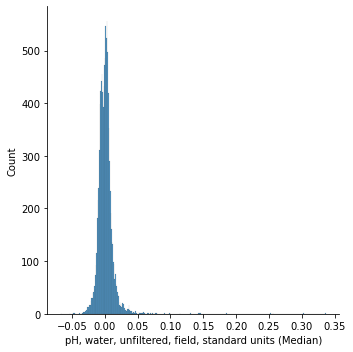

In [77]:
sns.displot((y_test-predictions))
# Graph shows that our linear regression model predicted quite well since most of error tends towards zero in the graph, that is error counts peaks at 0 error which shows good prediction


In [98]:
from sklearn import metrics
MAE1=metrics.mean_absolute_error(y_test,predictions)

In [99]:
MSE1=metrics.mean_squared_error(y_test,predictions)

In [100]:
RMSE1=np.sqrt(metrics.mean_squared_error(y_test,predictions))

In [78]:
# Predicting pH median, maximum and minimum from all other features and checking how is the accuracy and error values of predictions

In [79]:
y_train1=df_eda["pH, water, unfiltered, field, standard units (Maximum)"]
y_train1=pd.concat([df_eda["pH, water, unfiltered, field, standard units (Minimum)"],df_eda["pH, water, unfiltered, field, standard units (Median)"],y_train1],axis=1)

In [80]:

y_test1=pd.concat([x_test["pH, water, unfiltered, field, standard units (Minimum)"],x_test["pH, water, unfiltered, field, standard units (Maximum)"],df_3],axis=1)

In [81]:
x_train1=x_train.drop(["pH, water, unfiltered, field, standard units (Minimum)","pH, water, unfiltered, field, standard units (Maximum)"],axis=1)

In [82]:
x_test1=x_test.drop(["pH, water, unfiltered, field, standard units (Minimum)","pH, water, unfiltered, field, standard units (Maximum)"],axis=1)

In [117]:
# Prediction of more that one variable by Linear model 
df_combine_x=pd.concat([x_test1,x_train1],axis=0)
df_combine_x
df_combine_y=pd.concat([y_test1,y_train1],axis=0)
df_combine_y
from sklearn.model_selection import train_test_split
x_train1,x_test1,y_train1,y_test1=train_test_split(df_combine_x,df_combine_y,test_size=0.4)
from sklearn.linear_model import LinearRegression
model1=LinearRegression()
model1.fit(x_train1,y_train1)
predictions1=model1.predict(x_test1)
predictions1

array([[ 6.84454340e-03,  9.14901751e-01,  6.73799786e-01],
       [-2.09057355e-03,  9.11220633e-01,  6.75816767e-01],
       [ 1.79801014e-04,  8.69450930e-01,  6.61428301e-01],
       ...,
       [ 2.58639644e-03,  9.40622325e-01,  6.92846518e-01],
       [-3.67698324e-03,  9.05032067e-01,  6.95271690e-01],
       [ 1.71273462e-03,  8.48208621e-01,  6.27444346e-01]])

In [118]:
predictions1.shape
df_predict=pd.DataFrame(data=predictions1,columns=["pH, water, unfiltered, field, standard units (Minimum)","pH, water, unfiltered, field, standard units (Median)","pH, water, unfiltered, field, standard units (Maximum)"],)

In [119]:
df_predict

,"pH, water, unfiltered, field, standard units (Minimum)","pH, water, unfiltered, field, standard units (Median)","pH, water, unfiltered, field, standard units (Maximum)"
0,0.006845,0.914902,0.673800
1,-0.002091,0.911221,0.675817
2,0.000180,0.869451,0.661428
3,0.014003,0.832592,0.615868
4,-0.006354,0.910032,0.683826
...,...,...,...
10429,0.005315,0.874400,0.644961
10430,0.010691,0.865939,0.657307
10431,0.002586,0.940622,0.692847
10432,-0.003677,0.905032,0.695272


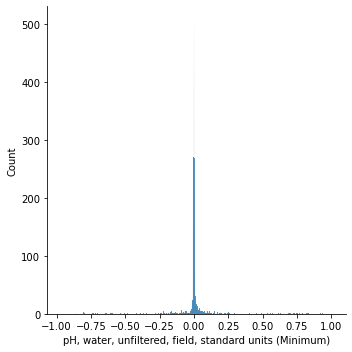

In [120]:
sns.displot((y_test1["pH, water, unfiltered, field, standard units (Minimum)"]-df_predict["pH, water, unfiltered, field, standard units (Minimum)"]))

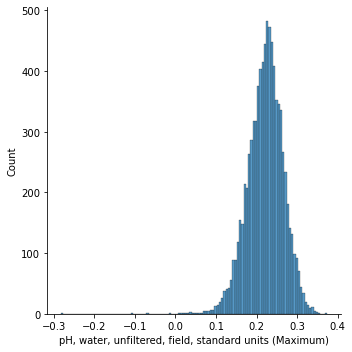

In [121]:
sns.displot((y_test1["pH, water, unfiltered, field, standard units (Maximum)"]-df_predict["pH, water, unfiltered, field, standard units (Maximum)"]))

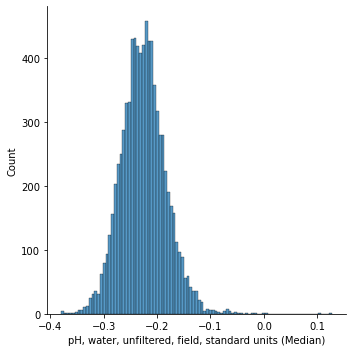

In [122]:
sns.displot((y_test1["pH, water, unfiltered, field, standard units (Median)"]-df_predict["pH, water, unfiltered, field, standard units (Median)"]))

In [137]:
from sklearn import metrics
MAE2=metrics.mean_absolute_error(y_test1["pH, water, unfiltered, field, standard units (Median)"],df_predict["pH, water, unfiltered, field, standard units (Median)"])
MAE2

0.22399627044878348

In [141]:

MSE2=metrics.mean_squared_error(y_test1["pH, water, unfiltered, field, standard units (Median)"],df_predict["pH, water, unfiltered, field, standard units (Median)"])
RMSE2=np.sqrt(metrics.mean_squared_error(y_test1["pH, water, unfiltered, field, standard units (Median)"],df_predict["pH, water, unfiltered, field, standard units (Median)"]))


In [142]:
Difference_MAE=abs(MAE1-MAE2)
Difference_MAE

0.21667592982094377

In [143]:
Difference_MSE=abs(MSE1-MSE2)
Difference_MSE

0.0502994338085337

In [144]:
Difference_RMSE=abs(RMSE1-RMSE2)
Difference_RMSE

0.2124576588791648

In [152]:

'''The difference in preditions by 2 models where in first model we had pH minimumand maximum values as input features 
and predicted pH median and in second model we didnt had pH minimum and maximum values as input features and predicted all three of them 
that is pH minimum, maximum and median ,
both of the models have considerable amount of difference in their predictions, RMSE,MAE,MSE.
thus it clearly shows that pH median values are highly correlated with pH minimum and maximum features.